## Dow 30 Portfolio Optimization 
### Exploratory Data Analysis

In [1]:
import yfinance as yf
import pandas as pd

In [2]:
df=pd.read_csv('data/dow_30.csv', sep=",")
df['Date'] = pd.to_datetime(df['Date'])

#df.drop(index=1, inplace=True)
df.head(3)
df

,Date,Open,High,Low,Close,Adj Close,Volume($),Symbol,Daily Return
0,2014-09-02,25.764999,25.934999,25.680000,25.825001,22.956745,214256000,AAPL,NaN
1,2014-09-03,25.775000,25.799999,24.645000,24.735001,21.987806,501684000,AAPL,-0.042207
2,2014-09-04,24.712500,25.022499,24.447500,24.530001,21.805574,342872000,AAPL,-0.008288
3,2014-09-05,24.700001,24.847500,24.577499,24.742500,21.994476,233828000,AAPL,0.008663
4,2014-09-08,24.825001,24.827499,24.512501,24.590000,21.858912,185426800,AAPL,-0.006163
...,...,...,...,...,...,...,...,...,...
72171,2024-05-10,118.540001,118.660004,117.580002,117.959999,117.009598,13648100,XOM,-0.004053
72172,2024-05-13,118.419998,119.040001,117.120003,117.910004,116.960007,15060600,XOM,-0.000424
72173,2024-05-14,116.790001,117.739998,116.480003,117.669998,117.669998,15079100,XOM,-0.002035
72174,2024-05-15,117.610001,118.839996,116.080002,118.580002,118.580002,18244300,XOM,0.007734


In [3]:
sorted_df = df.sort_values(by='Close', ascending=False)
sorted_df


,Date,Open,High,Low,Close,Adj Close,Volume($),Symbol,Daily Return
59568,2022-10-31,555.000000,558.099976,550.130005,555.150024,540.800049,2770400,UNH,0.007093
59574,2022-11-08,547.049988,554.799988,542.000000,553.049988,538.754395,2797000,UNH,0.014733
59840,2023-11-30,535.789978,553.940002,534.010010,552.969971,546.607178,7121200,UNH,0.033627
59567,2022-10-28,544.969971,553.000000,543.690002,551.239990,536.991211,2761900,UNH,0.017423
59843,2023-12-05,549.099976,552.530029,545.349976,550.260010,545.783997,2645600,UNH,0.003611
...,...,...,...,...,...,...,...,...,...
67276,2024-05-01,17.410000,17.680000,17.250000,17.340000,17.101551,10838800,WBA,-0.021997
67279,2024-05-06,17.840000,17.930000,17.240000,17.260000,17.022652,11521500,WBA,-0.030881
67282,2024-05-09,17.250000,17.350000,17.129999,17.250000,17.012789,6182000,WBA,0.001161
67281,2024-05-08,17.250000,17.370001,17.209999,17.230000,16.993063,7197800,WBA,-0.006916


In [4]:
stock_count = df['Symbol'].value_counts()
stock_count

Symbol
AAPL    2444
AMGN    2444
WMT     2444
WBA     2444
VZ      2444
V       2444
UNH     2444
TRV     2444
PG      2444
NKE     2444
MSFT    2444
MRK     2444
MMM     2444
MCD     2444
JPM     2444
JNJ     2444
INTC    2444
IBM     2444
HON     2444
HD      2444
GS      2444
DIS     2444
CVX     2444
CSCO    2444
CRM     2444
CAT     2444
BA      2444
AXP     2444
XOM     2444
DOW     1300
Name: count, dtype: int64

### DOW-30 Market History Data - EDA 

In [5]:
df.describe()

,Date,Open,High,Low,Close,Adj Close,Volume($),Daily Return
count,72176,72176.000000,72176.000000,72176.000000,72176.000000,72176.000000,7.217600e+04,72146.000000
mean,2019-07-24 01:17:13.872755200,131.817290,133.064414,130.546308,131.830634,119.972952,1.373809e+07,0.000453
min,2014-09-02 00:00:00,17.250000,17.350000,17.120001,17.190001,15.772874,3.054000e+05,-0.238484
25%,2017-02-21 00:00:00,67.459999,68.110516,66.747499,67.489998,56.895176,3.463700e+06,-0.007136
50%,2019-08-07 00:00:00,116.971622,118.000000,115.809998,116.910004,102.175709,6.364100e+06,0.000501
75%,2021-12-23 00:00:00,168.332500,169.912502,166.740005,168.369995,155.516342,1.369248e+07,0.008248
max,2024-05-16 00:00:00,555.000000,558.099976,550.130005,555.150024,546.607178,7.593852e+08,0.260449
std,NaN,84.247632,85.081046,83.406370,84.259837,83.080027,2.671141e+07,0.017043


In [6]:
zero_counts = (df == 0).sum()

zero_counts

Date              0
Open              0
High              0
Low               0
Close             0
Adj Close         0
Volume($)         0
Symbol            0
Daily Return    297
dtype: int64

In [7]:
# Filter the dataset to get rows where the Volume is 0
rows_with_zero_volume = df[df['Volume($)'] == 0]

rows_with_zero_volume


,Date,Open,High,Low,Close,Adj Close,Volume($),Symbol,Daily Return


In [8]:
stock_count = rows_with_zero_volume['Symbol'].value_counts()
stock_count

Series([], Name: count, dtype: int64)

#### Correlation Analysis

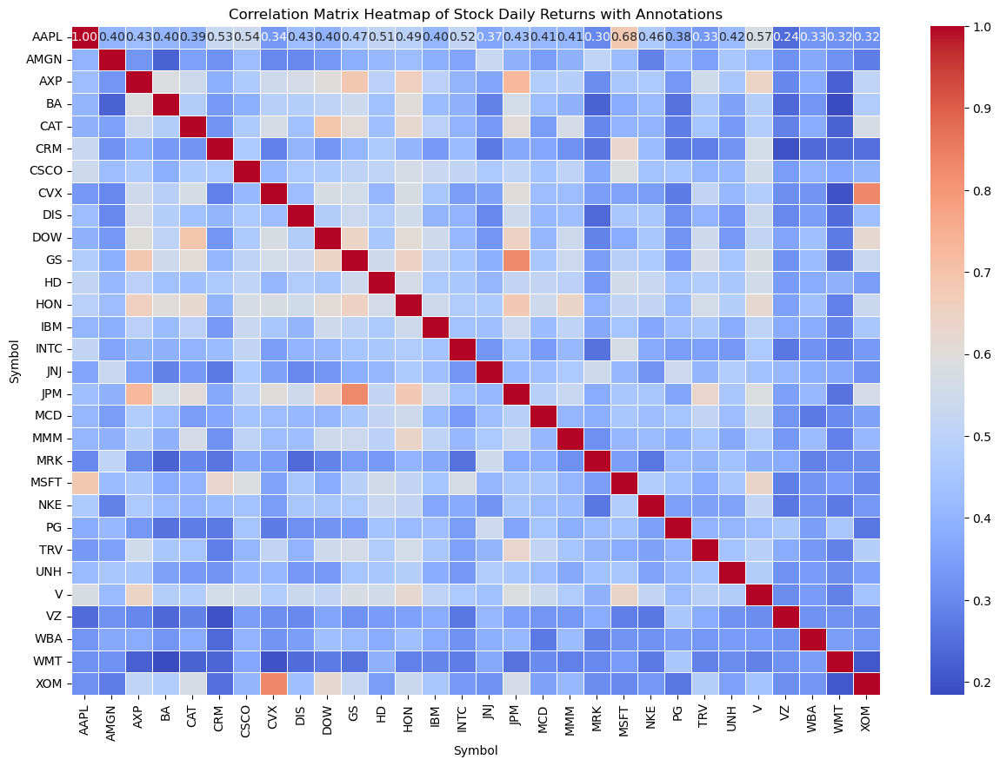

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pivot the data to have symbols as columns and dates as rows for the daily returns
pivot_returns = df.pivot_table(values='Daily Return', index='Date', columns='Symbol', aggfunc='first')

correlation_matrix = df.pivot_table(values='Daily Return', index='Date', columns='Symbol', aggfunc='first').corr()

plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', linewidths=.5)
plt.title('Correlation Matrix Heatmap of Stock Daily Returns with Annotations')
plt.show()

In [10]:
stock_count = df['Symbol'].value_counts()
stock_count

Symbol
AAPL    2444
AMGN    2444
WMT     2444
WBA     2444
VZ      2444
V       2444
UNH     2444
TRV     2444
PG      2444
NKE     2444
MSFT    2444
MRK     2444
MMM     2444
MCD     2444
JPM     2444
JNJ     2444
INTC    2444
IBM     2444
HON     2444
HD      2444
GS      2444
DIS     2444
CVX     2444
CSCO    2444
CRM     2444
CAT     2444
BA      2444
AXP     2444
XOM     2444
DOW     1300
Name: count, dtype: int64

#### Trend Analysis

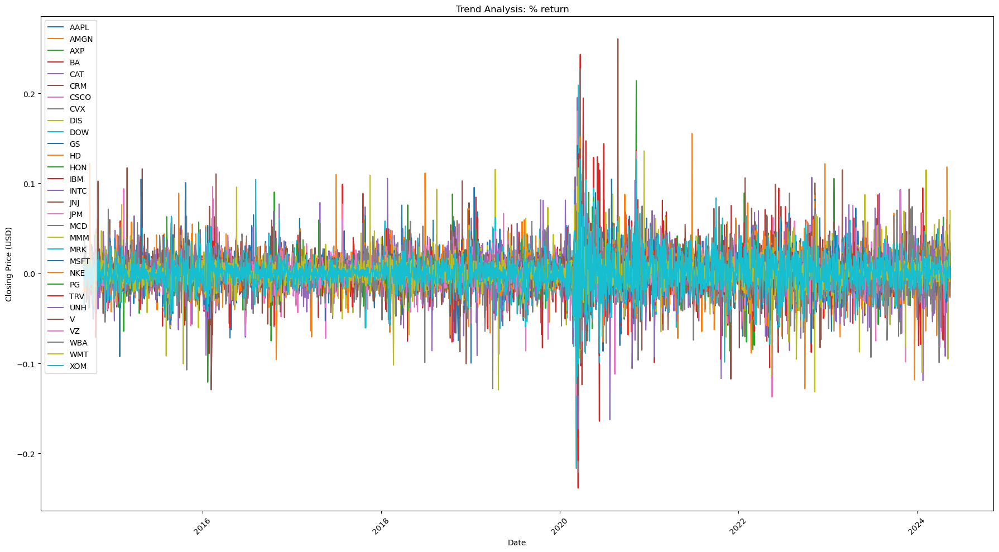

In [11]:
import matplotlib.dates as mdates
excluded_stocks = ['WBTC']


stock_data_excluded = df[~df['Symbol'].isin(excluded_stocks)]

stock_data_excluded['Date'] = pd.to_datetime(stock_data_excluded['Date'])

plt.figure(figsize=(18, 10))

for symbol in stock_data_excluded['Symbol'].unique():
    subset = stock_data_excluded[stock_data_excluded['Symbol'] == symbol]
    plt.plot(subset['Date'], subset['Daily Return'], label=symbol)

# Set the locator for the x-axis to pick dates at regular intervals
locator = mdates.AutoDateLocator(minticks=3, maxticks=8)
formatter = mdates.ConciseDateFormatter(locator)

plt.gca().xaxis.set_major_locator(locator)
plt.gca().xaxis.set_major_formatter(formatter)

plt.title('Trend Analysis: % return   ')
plt.xlabel('Date')
plt.ylabel('Closing Price (USD)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


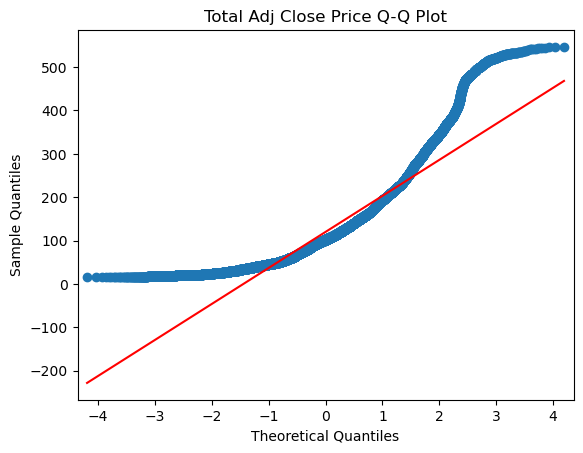

In [12]:
from statsmodels.graphics.gofplots import qqplot

df_adj_close = df['Adj Close']

# Generate the Q-Q plot
qqplot(df_adj_close, line='s')
plt.title('Total Adj Close Price Q-Q Plot')
plt.show()

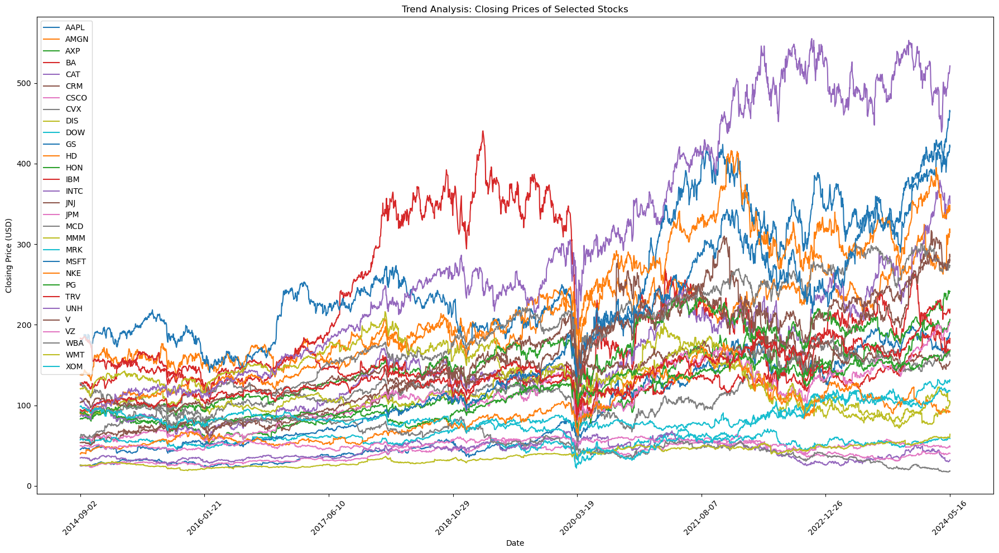

In [13]:
selected_stocks = [
    "AAPL", "AMGN", "AXP", "BA", "CAT", "CRM", "CSCO", "CVX", 
    "DIS", "DOW", "GS", "HD", "HON", "IBM", "INTC", "JNJ", 
    "JPM", "MCD", "MMM", "MRK", "MSFT", "NKE", "PG", "TRV", 
    "UNH", "V", "VZ", "WBA", "WMT", "XOM"
]
stock_data_selected = df[df['Symbol'].isin(selected_stocks)]

# Plotting the time-series graph for the selected stocks' closing prices
plt.figure(figsize=(18, 10))

for symbol in selected_stocks:
    subset = stock_data_selected[stock_data_selected['Symbol'] == symbol]
    plt.plot(subset['Date'], subset['Close'], label=symbol)
    
# Simplify the date ticks to display only 8 dates
plt.xticks(pd.date_range(start=df['Date'].min(), end=df['Date'].max(), periods=8))

plt.title('Trend Analysis: Closing Prices of Selected Stocks')
plt.xlabel('Date')
plt.ylabel('Closing Price (USD)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


C:\Users\Artem Frenk\AppData\Local\Temp\ipykernel_19384\1623957194.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stock_data_excluded['Date'] = pd.to_datetime(stock_data_excluded['Date'])


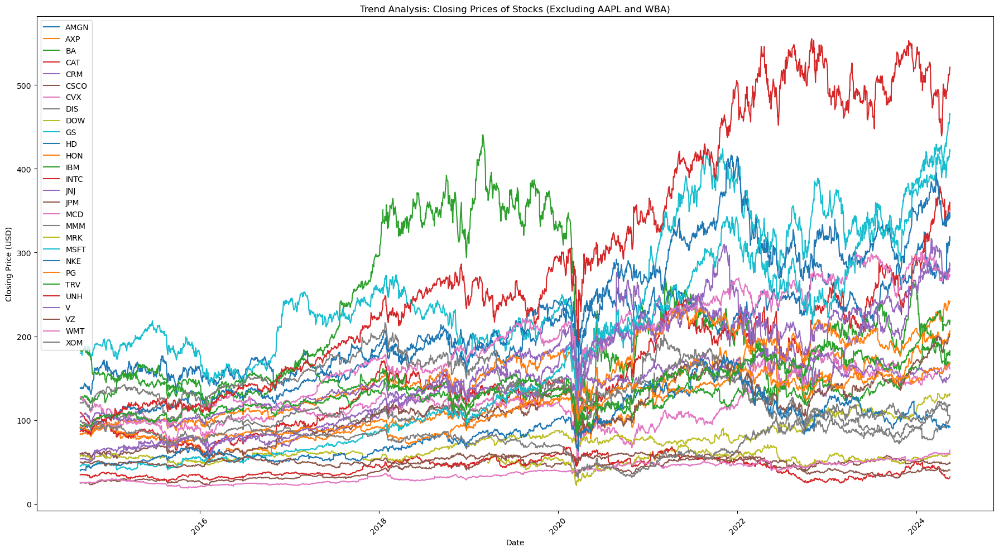

In [14]:

excluded_stocks = ['AAPL', 'WBA']
# Filter the dataset to exclude the selected stocks
stock_data_excluded = df[~df['Symbol'].isin(excluded_stocks)]

# Convert the 'Date' column to datetime if it's not already
stock_data_excluded['Date'] = pd.to_datetime(stock_data_excluded['Date'])

# Plotting the time-series graph for the stocks excluding the selected ones
plt.figure(figsize=(18, 10))

for symbol in stock_data_excluded['Symbol'].unique():
    subset = stock_data_excluded[stock_data_excluded['Symbol'] == symbol]
    plt.plot(subset['Date'], subset['Close'], label=symbol)

# Set the locator for the x-axis to pick dates at regular intervals
locator = mdates.AutoDateLocator(minticks=3, maxticks=8)
formatter = mdates.ConciseDateFormatter(locator)

plt.gca().xaxis.set_major_locator(locator)
plt.gca().xaxis.set_major_formatter(formatter)

plt.title('Trend Analysis: Closing Prices of Stocks (Excluding AAPL and WBA)')
plt.xlabel('Date')
plt.ylabel('Closing Price (USD)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


#### Volatility Analysis
Calculate the standard deviation of daily returns for each respective stock.


In [15]:

volatility = pivot_returns.std()

# Sort the stocks by their volatilities in descending order
volatility_sorted = volatility.sort_values(ascending=False)


volatility_sorted

Symbol
BA      0.025296
DOW     0.023356
CRM     0.021675
INTC    0.021151
AXP     0.019460
WBA     0.019147
CVX     0.018886
CAT     0.018775
NKE     0.018372
AAPL    0.018040
GS      0.017988
XOM     0.017703
DIS     0.017573
MSFT    0.017226
JPM     0.017153
UNH     0.016230
CSCO    0.015870
AMGN    0.015734
V       0.015587
HD      0.015381
MMM     0.015218
IBM     0.015145
TRV     0.014911
HON     0.014403
MRK     0.013559
WMT     0.013357
MCD     0.012861
VZ      0.012215
PG      0.011677
JNJ     0.011468
dtype: float64

#### Volume Analysis
##### Why is Volume Analysis important?
###### Volume analysis is important in the stock market because it shows how much traction, positive or negative, a stock is receiving. High buy volume means lots of people are buying in, high sell volume vice versa.

 Some things to consider: 
 
 Does the stocks trading volume go up or down by a lot often? (AKA volatility). 
 
 If a stock has very little volume, what is your insight? Is it the calm before the storm, or not many people are interested? Remember "hype" and traction for a stock is just as important as a company's fundamentals.

 Would you want to see a more detailed view of Volume history for a shorter time period before providing insight. (EX: $APPL trading volume used to be very volatile from 2015 - 2020. As seen in the chart, the trading volume is less heavy compared to today. I want to see the trading volume from 2020-2024 before providing insight on our model)


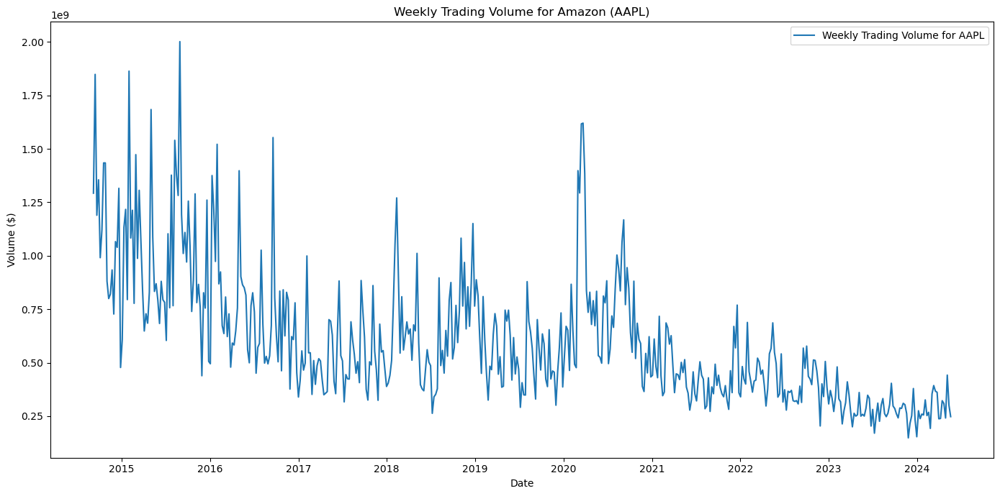

In [16]:
#vol analysis of AAPL

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

aapl_volume = df[df['Symbol'] == 'AAPL'].set_index('Date')['Volume($)']

# Resample to weekly volume
aapl_weekly_volume = aapl_volume.resample('W').sum()


plt.figure(figsize=(14, 7))
plt.plot(aapl_weekly_volume.index, aapl_weekly_volume, label='Weekly Trading Volume for AAPL')
plt.title('Weekly Trading Volume for Amazon (AAPL)')
plt.xlabel('Date')
plt.ylabel('Volume ($)')
plt.legend()
plt.tight_layout()
plt.show()


#### Outlier Detection:

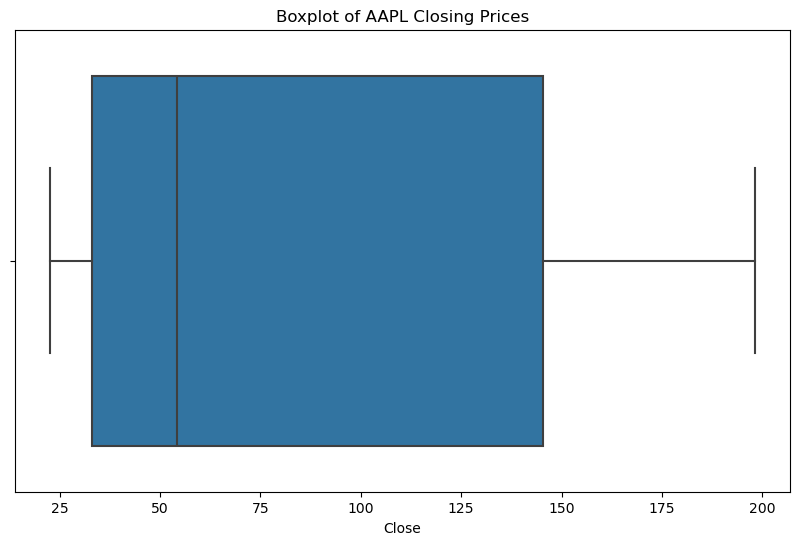

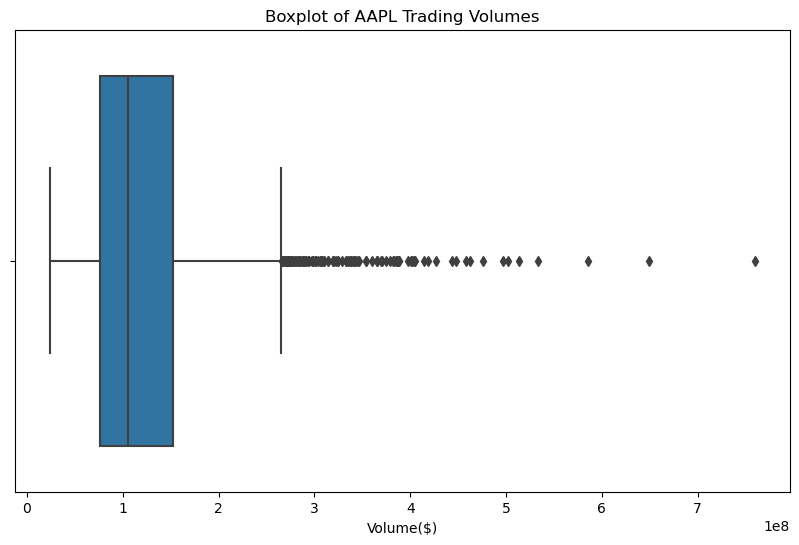

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns


aapl_data = df[df['Symbol'] == 'AAPL']

# Boxplot for closing prices
plt.figure(figsize=(10, 6))
sns.boxplot(x=aapl_data['Close'])
plt.title('Boxplot of AAPL Closing Prices')
plt.show()

# Boxplot for volumes
plt.figure(figsize=(10, 6))
sns.boxplot(x=aapl_data['Volume($)'])
plt.title('Boxplot of AAPL Trading Volumes')
plt.show()


#### Moving Averages


##### 30-day

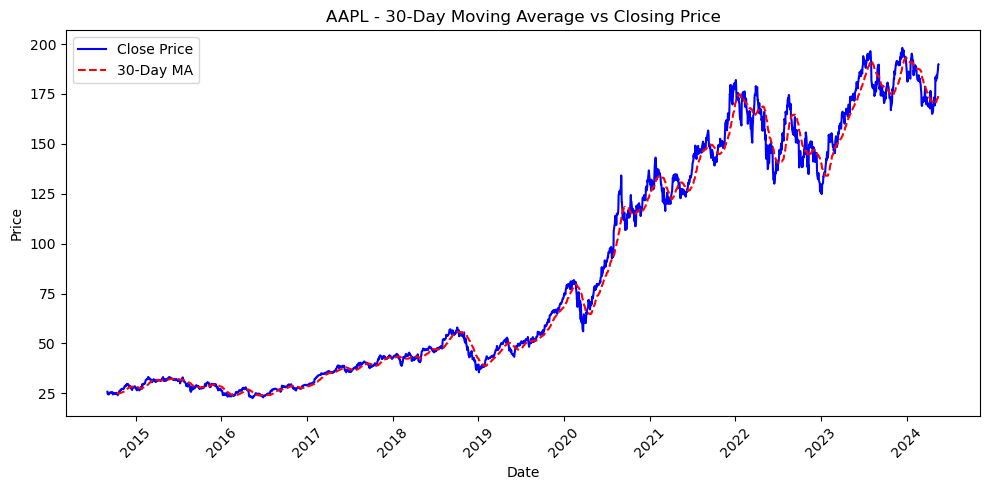

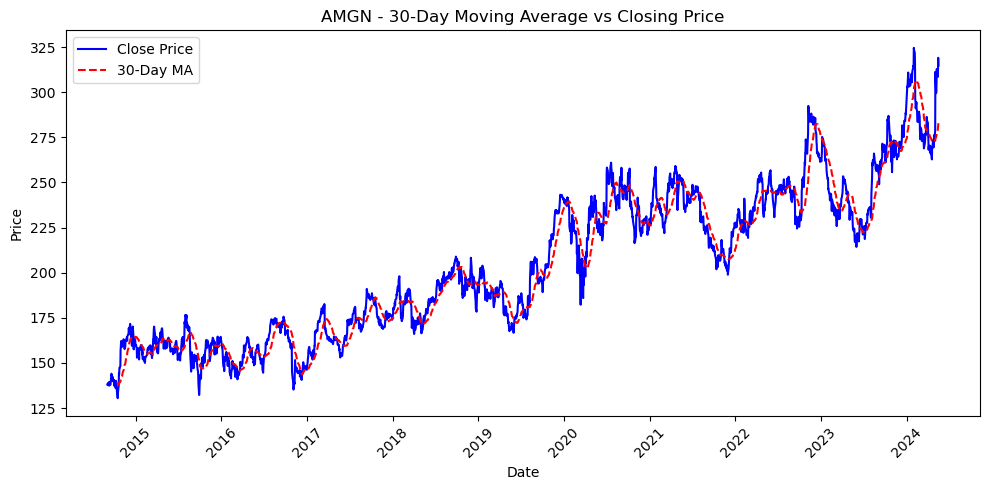

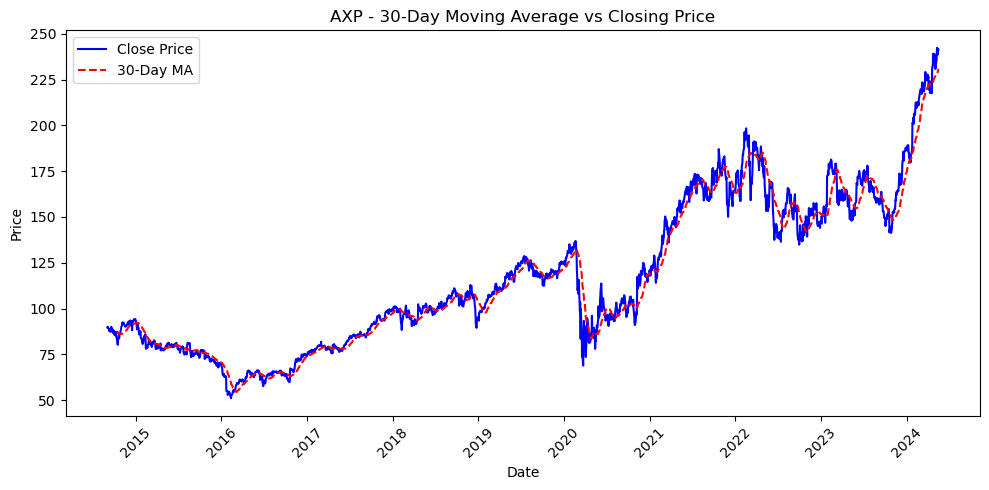

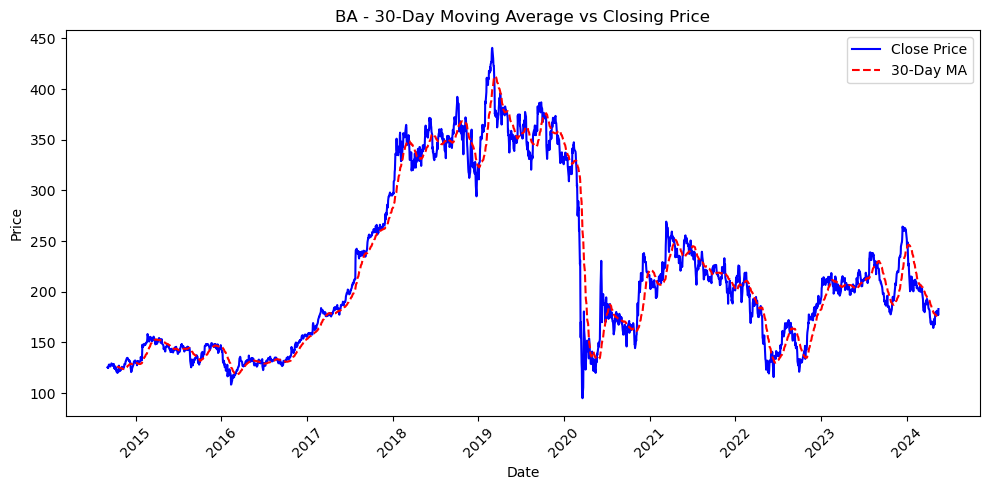

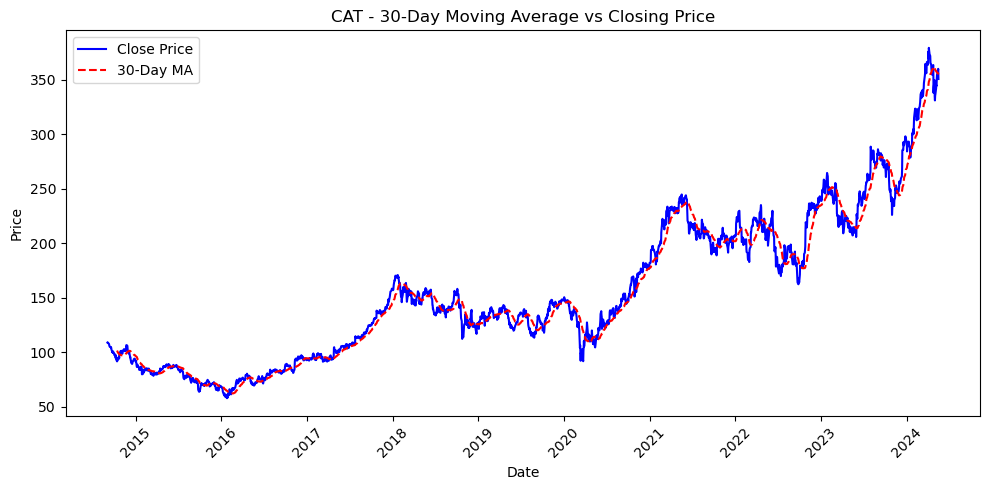

...

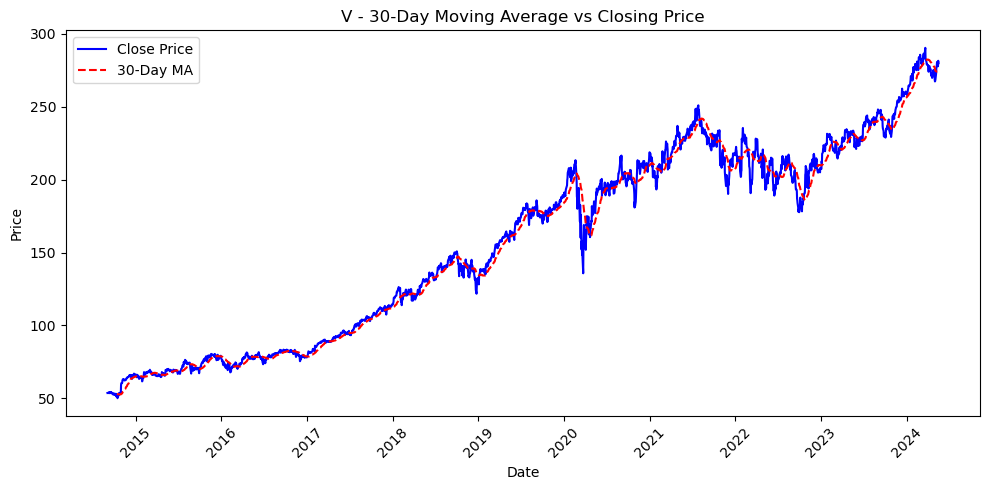

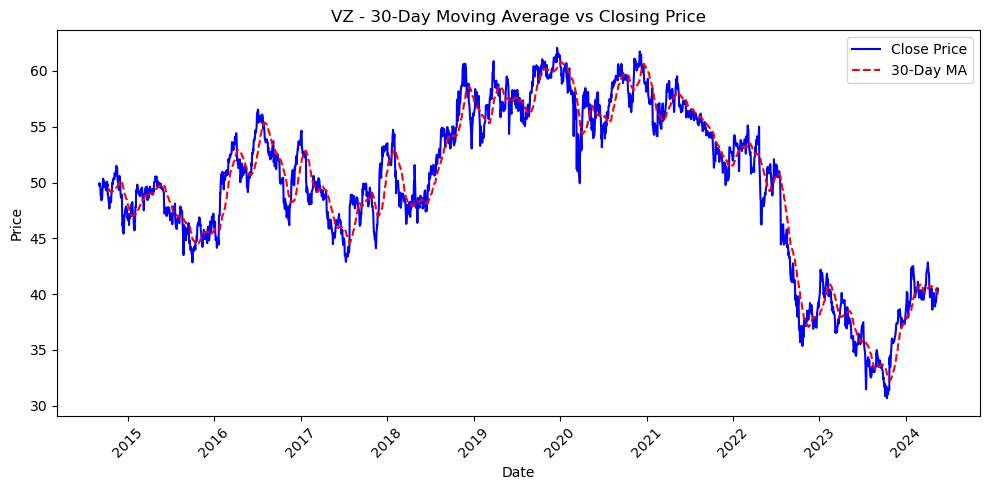

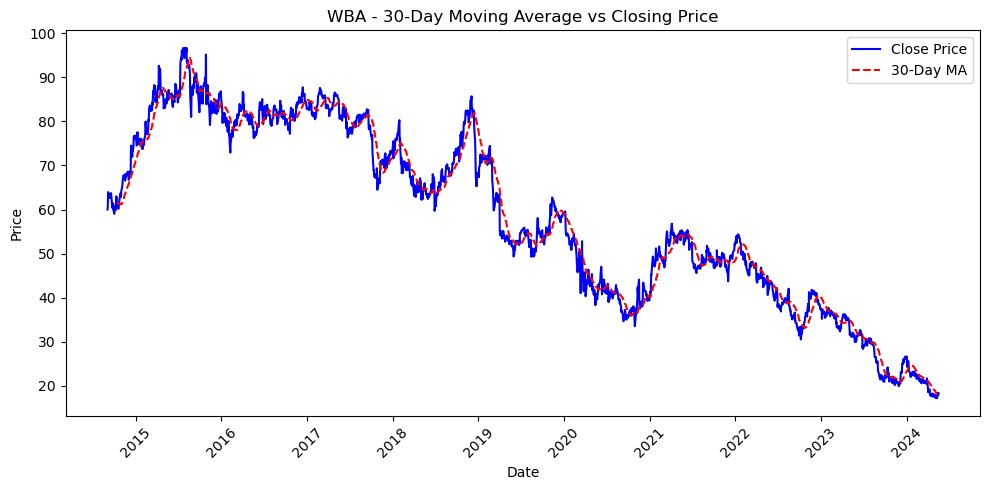

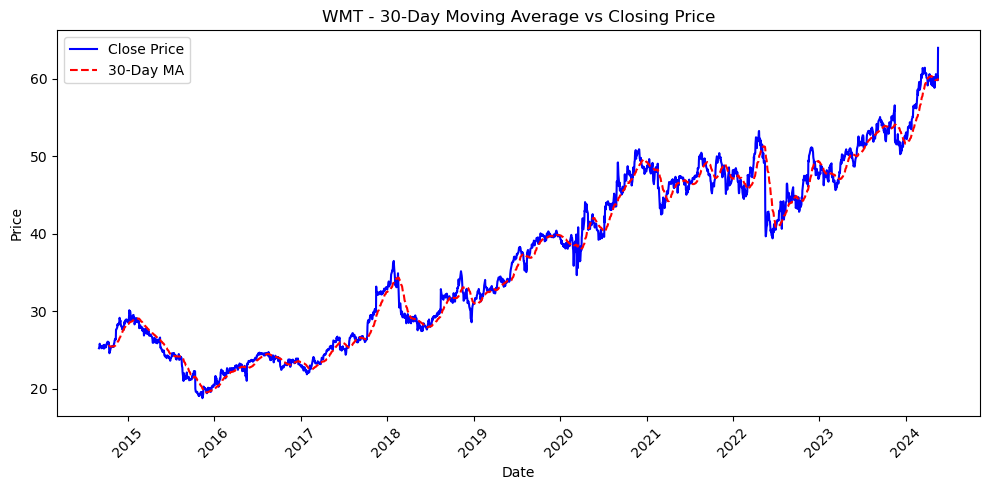

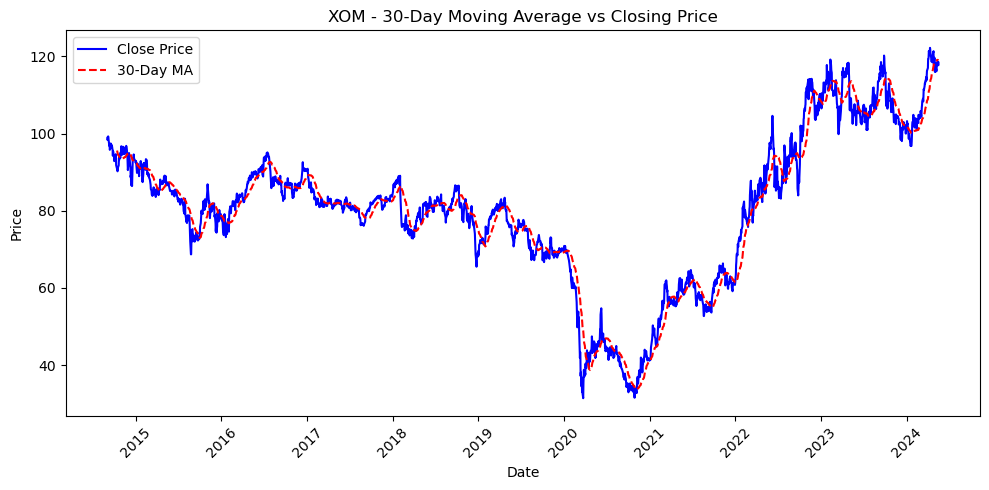

In [18]:
# Calculate 30-day Moving Averages for the Closing Prices of each stock
df['30_day_MA'] = df.groupby('Symbol')['Close'].transform(lambda x: x.rolling(window=30).mean())

stocks = df['Symbol'].unique()

# Creating a separate plot for each stock
for stock in stocks:
    subset = df[df['Symbol'] == stock]
    
    plt.figure(figsize=(10, 5))
    plt.plot(subset['Date'], subset['Close'], label='Close Price', color='blue')
    plt.plot(subset['Date'], subset['30_day_MA'], label='30-Day MA', linestyle='--', color='red')
    
    plt.title(f'{stock} - 30-Day Moving Average vs Closing Price')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

##### 60-day Moving Average


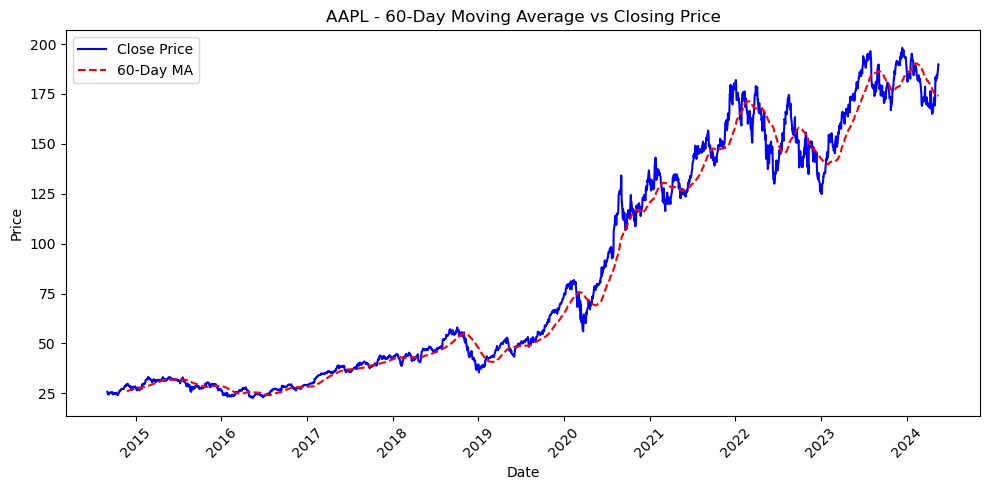

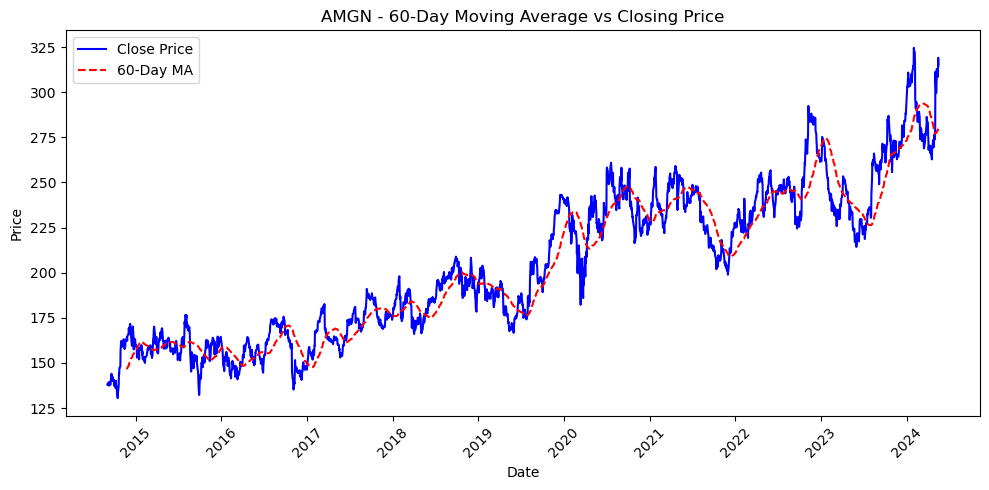

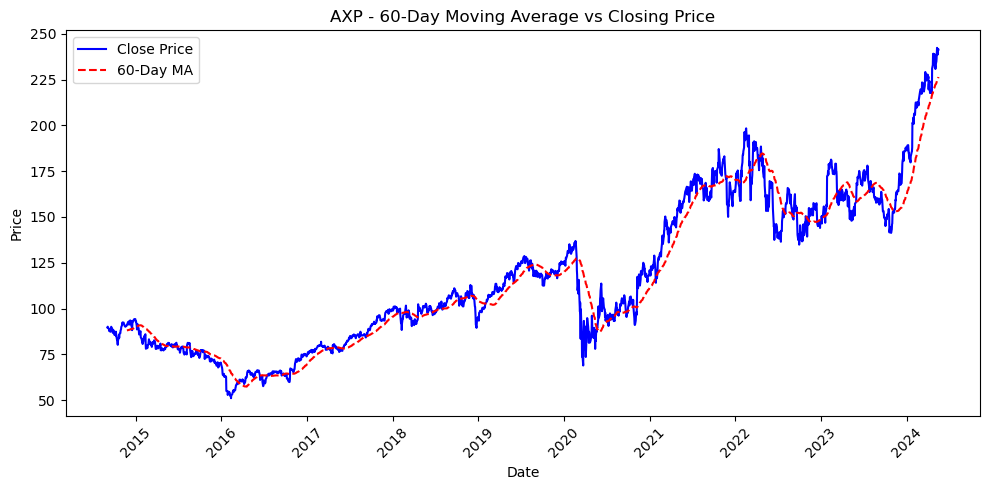

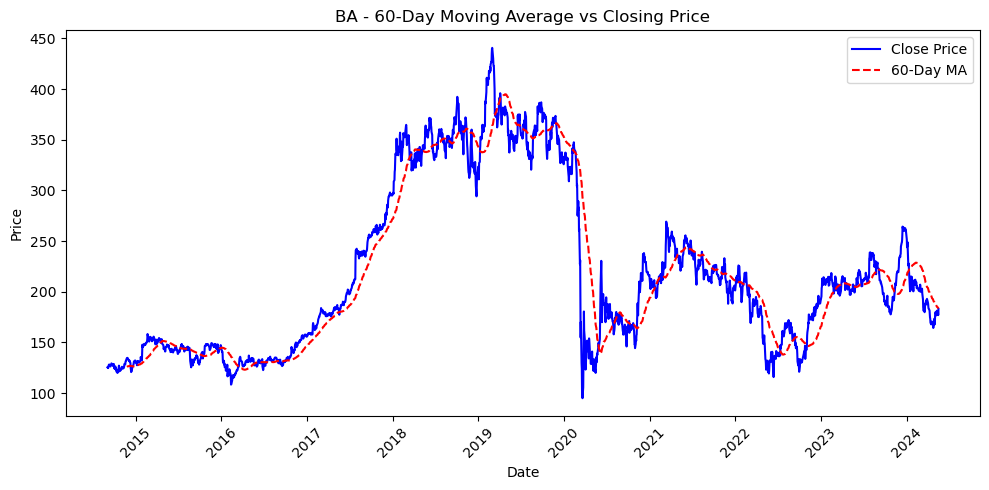

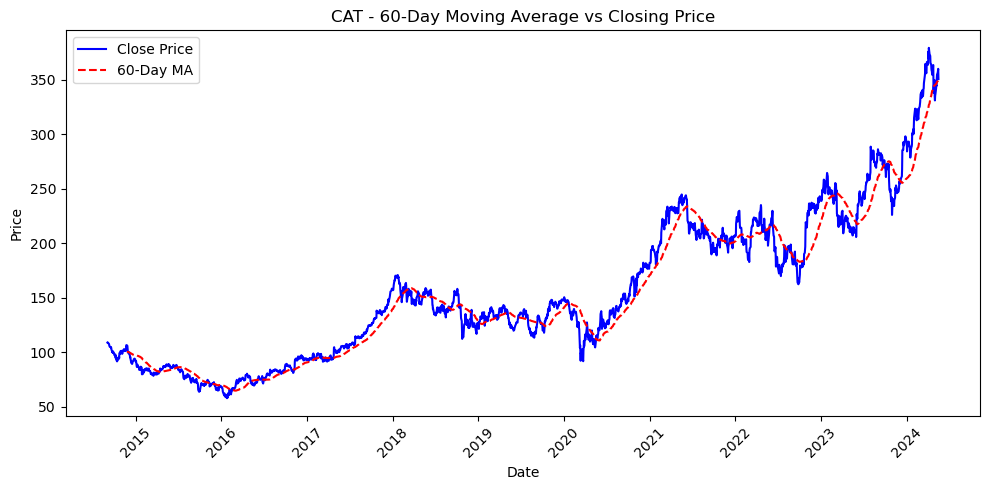

...

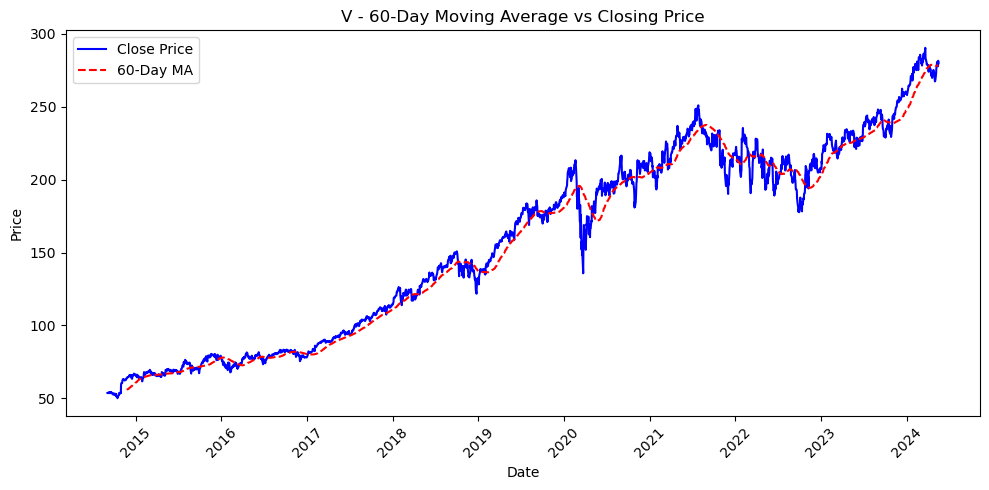

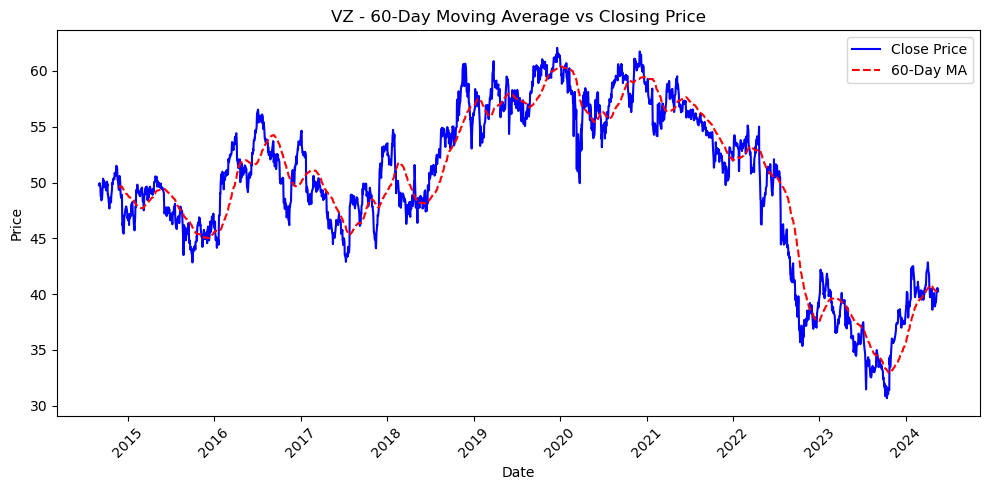

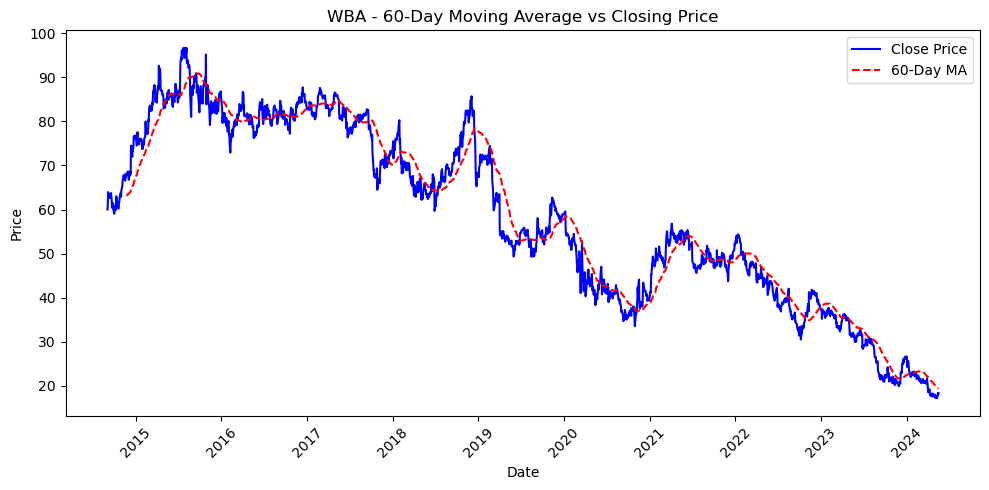

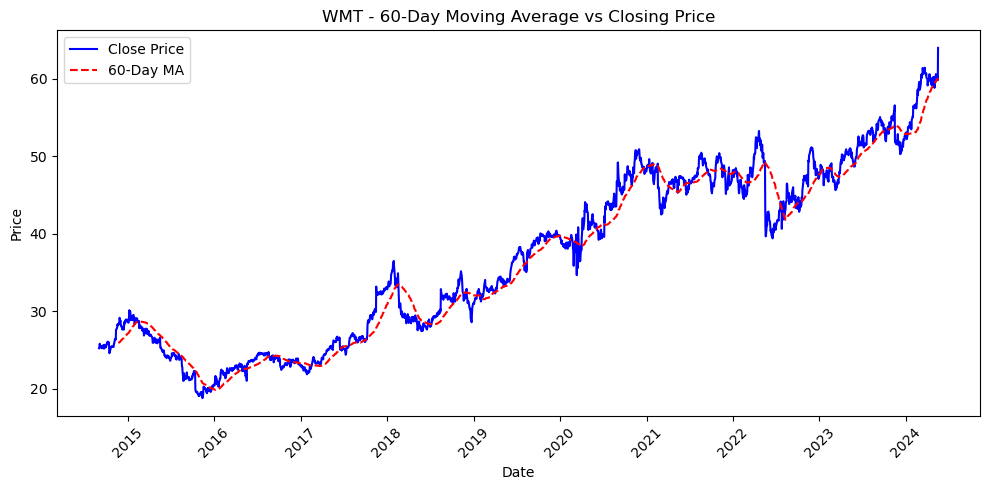

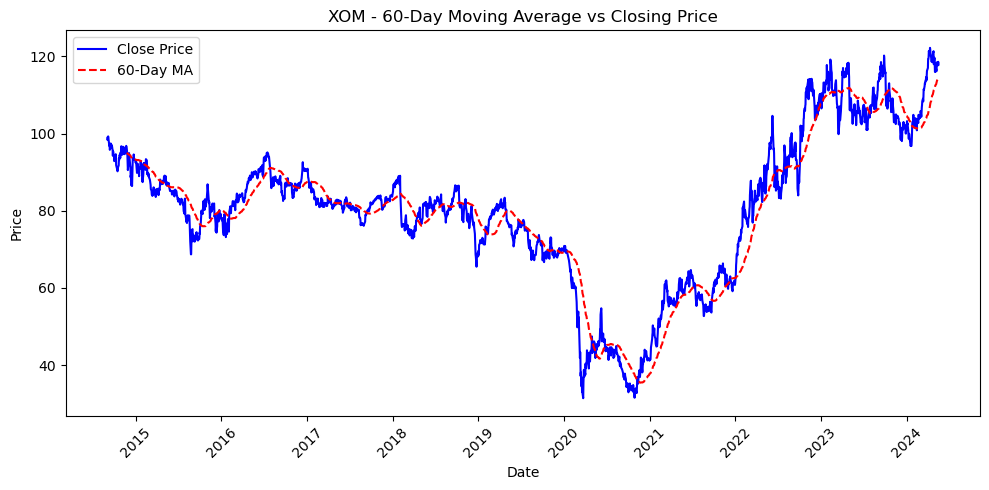

In [19]:
# Calculate 60-day Moving Averages for the Closing Prices of each stock
df['60_day_MA'] = df.groupby('Symbol')['Close'].transform(lambda x: x.rolling(window=60).mean())

stocks = df['Symbol'].unique()

# Creating a separate plot for each stock
for stock in stocks:
    subset = df[df['Symbol'] == stock]
    
    plt.figure(figsize=(10, 5))
    plt.plot(subset['Date'], subset['Close'], label='Close Price', color='blue')
    plt.plot(subset['Date'], subset['60_day_MA'], label='60-Day MA', linestyle='--', color='red')
    
    plt.title(f'{stock} - 60-Day Moving Average vs Closing Price')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

##### 90-day Moving Average

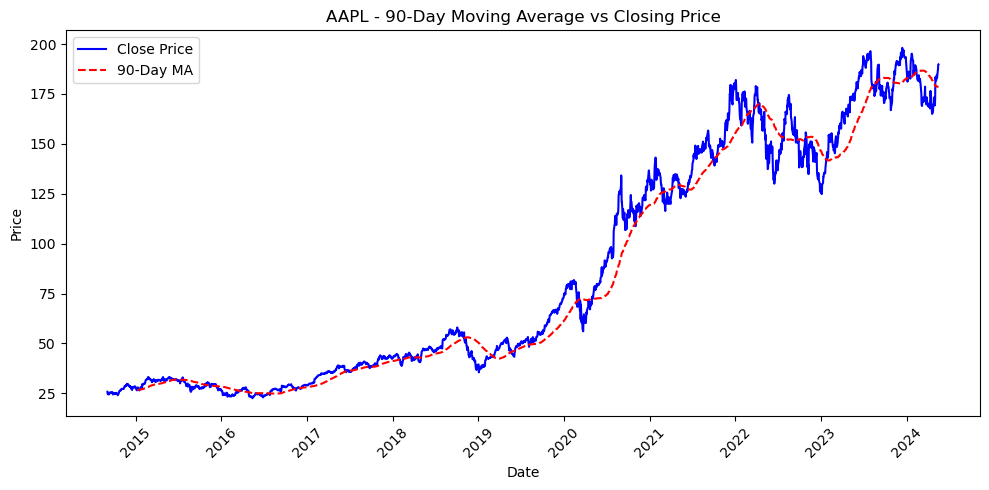

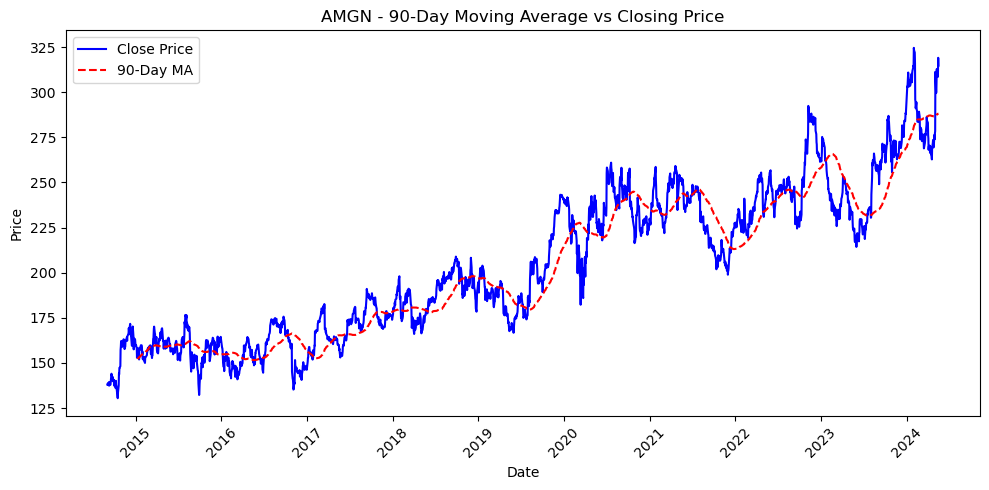

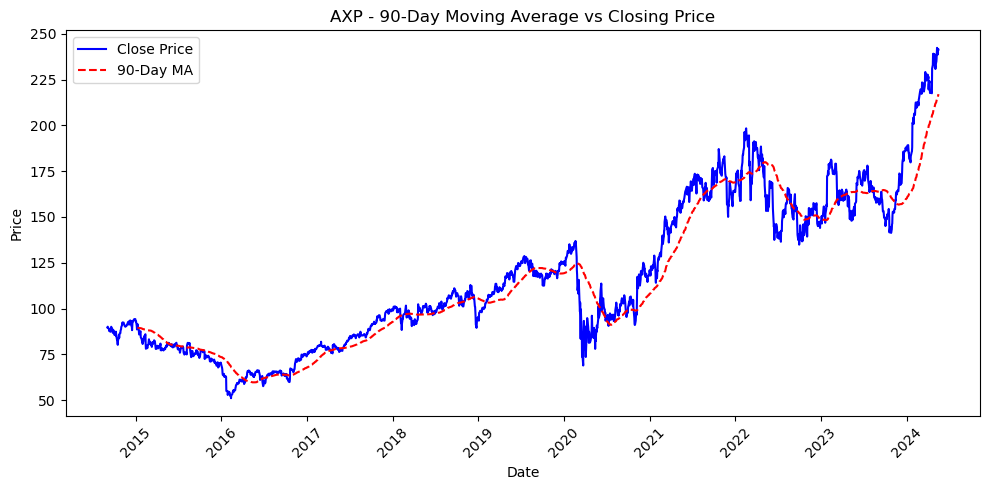

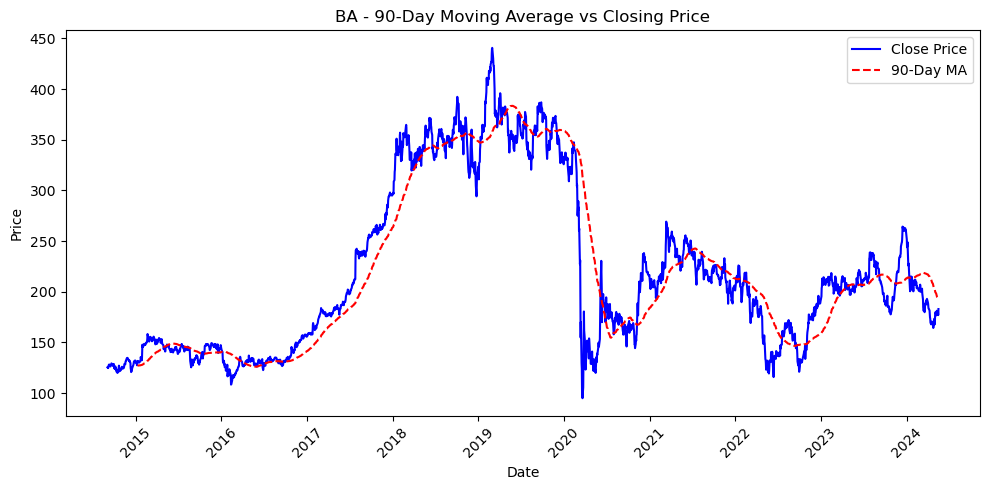

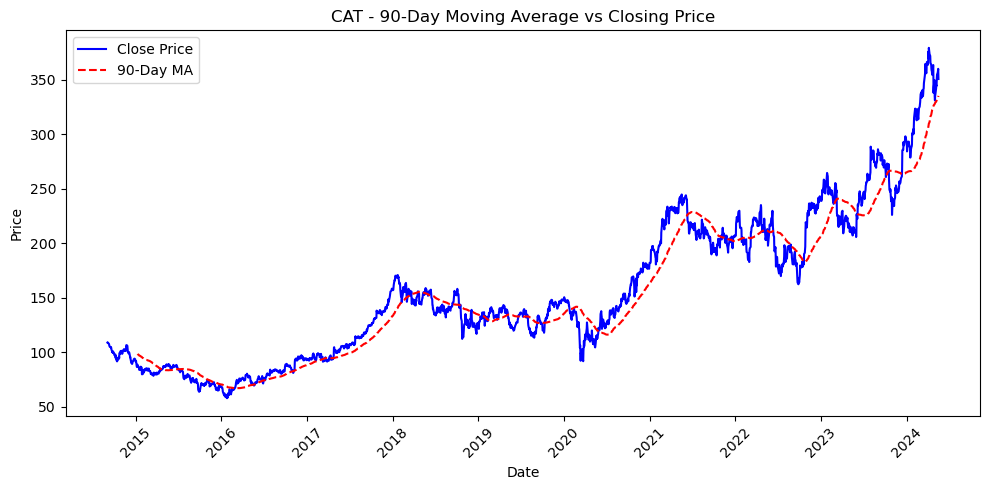

...

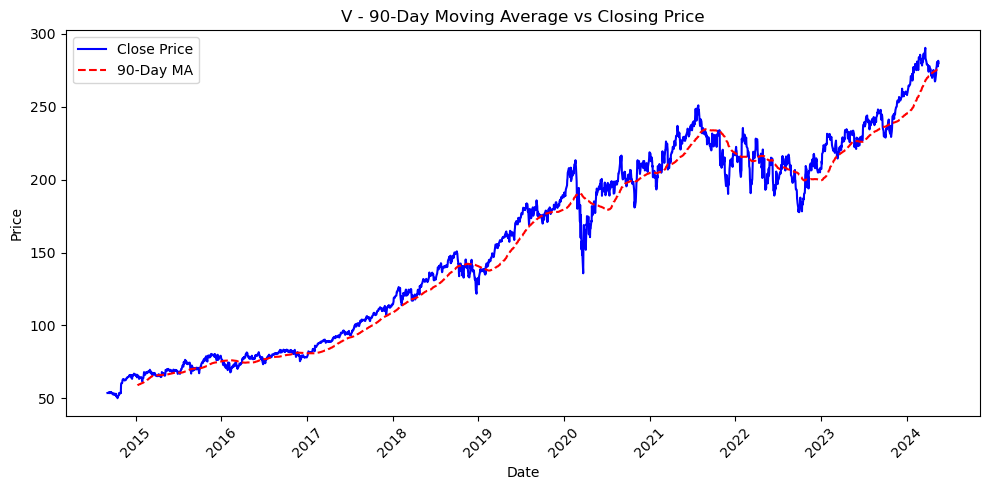

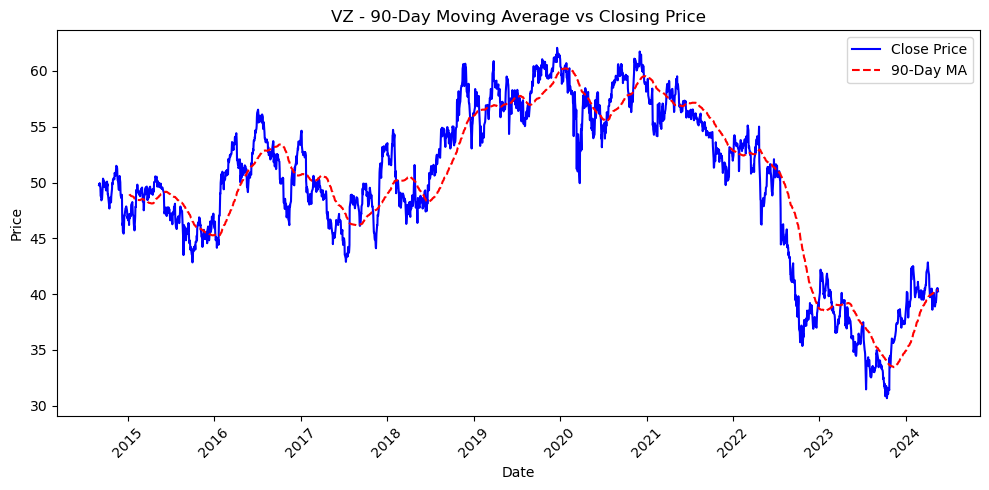

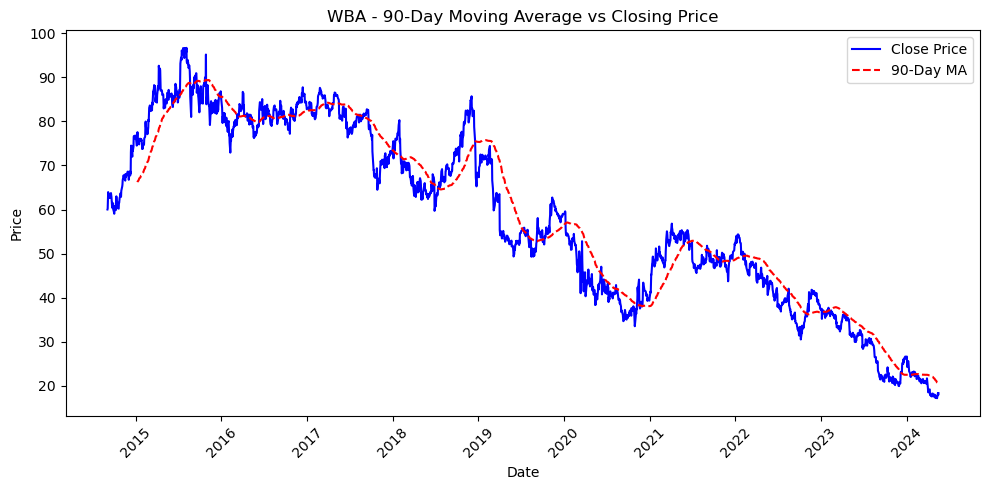

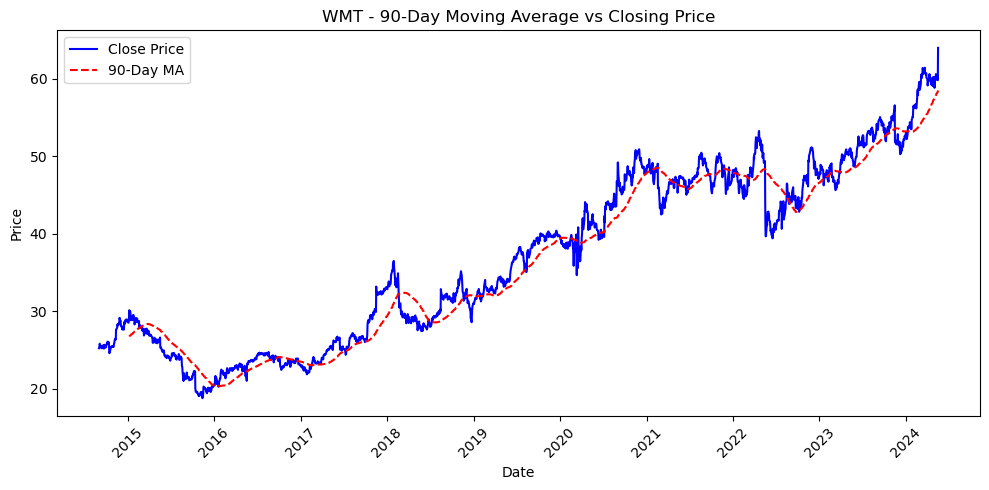

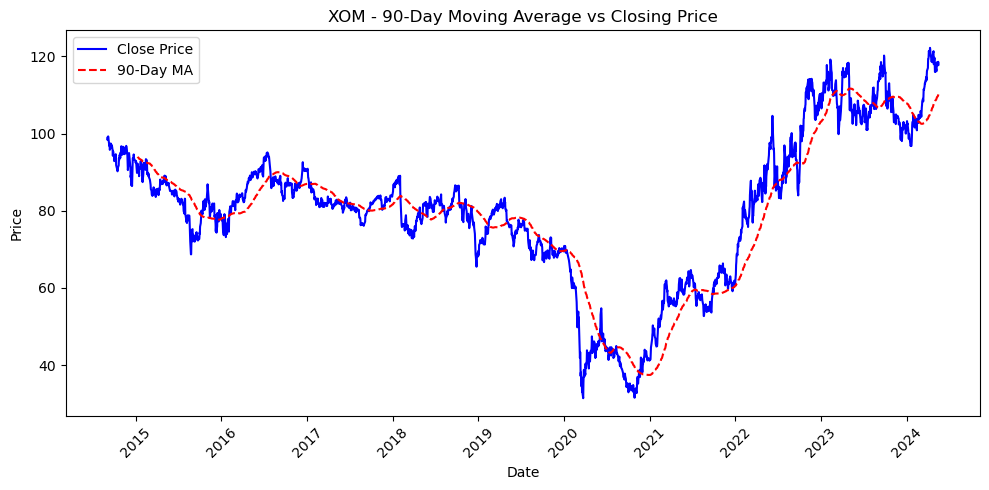

In [20]:
# Calculate 90-day Moving Averages for the Closing Prices of each stock
df['90_day_MA'] = df.groupby('Symbol')['Close'].transform(lambda x: x.rolling(window=90).mean())

stocks = df['Symbol'].unique()

# Creating a separate plot for each stock
for stock in stocks:
    subset = df[df['Symbol'] == stock]
    
    plt.figure(figsize=(10, 5))
    plt.plot(subset['Date'], subset['Close'], label='Close Price', color='blue')
    plt.plot(subset['Date'], subset['90_day_MA'], label='90-Day MA', linestyle='--', color='red')
    
    plt.title(f'{stock} - 90-Day Moving Average vs Closing Price')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [21]:
df.drop(['30_day_MA', '60_day_MA', '90_day_MA'], axis=1, inplace=True)


#### Seasonality Analysis

In [22]:
df_seasonality =  df 

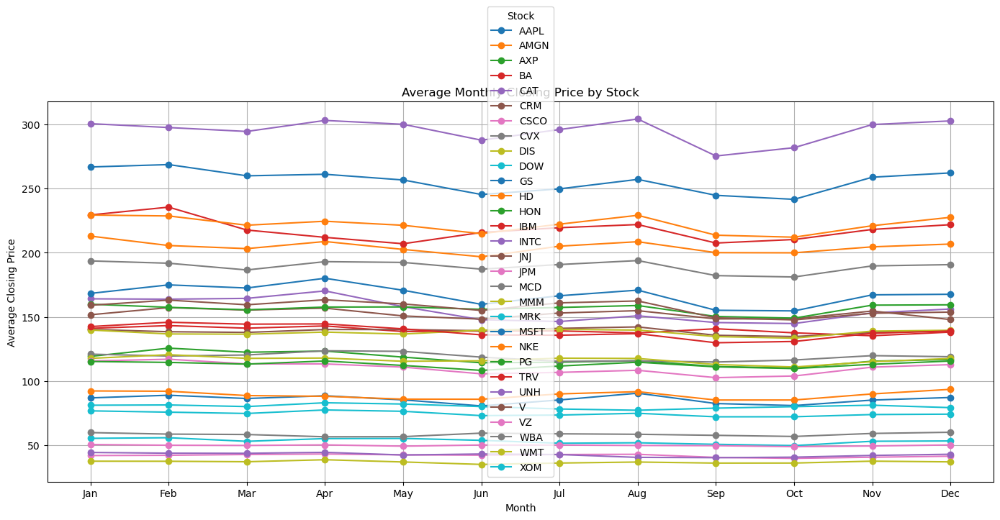

In [23]:
# Resample data to monthly and calculate average closing price for each stock
df_seasonality['Month'] = df_seasonality['Date'].dt.month
monthly_avg = df_seasonality.groupby(['Symbol', 'Month'])['Close'].mean().unstack(level=0)

# Plot the monthly average closing price for each stock
monthly_avg.plot(figsize=(14, 7), marker='o')
plt.title('Average Monthly Closing Price by Stock')
plt.xlabel('Month')
plt.ylabel('Average Closing Price')
plt.grid(True)
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend(title='Stock')
plt.tight_layout()
plt.show()

##### Volatility- Daily Price changes 
###### What's the importance of tracking daily price changes? It can show how resistant a stock can be to the highs and lows of the market. For example a lot of these spikes not only come from huge news reports that caused every stock to crash (such as covid), but they also come from things like Earnigns reports too. Maybe if we were able to mark when a company had a earnings call and see it's price change on the daily, we could gain some valuable insight.

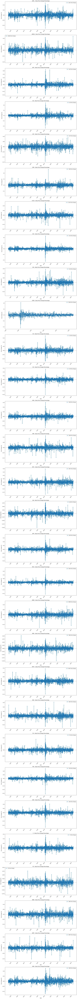

In [24]:
df_stocks_volatility = df


stocks = df_stocks_volatility['Symbol'].unique()
num_stocks = len(stocks)
fig, axes = plt.subplots(num_stocks, 1, figsize=(14, 6 * num_stocks))

for i, stock in enumerate(stocks):
    subset = df_stocks_volatility[df_stocks_volatility['Symbol'] == stock]
    axes[i].plot(subset['Date'], subset['Daily Return'], label=f'{stock} Price Change', marker='o', linestyle='-', markersize=4)
    axes[i].set_title(f'{stock} - Daily Price Change Percentage')
    axes[i].set_xlabel('Date')
    axes[i].set_ylabel('Price Change (%)')
    axes[i].legend()
    axes[i].axhline(0, color='black', linewidth=0.5)   
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


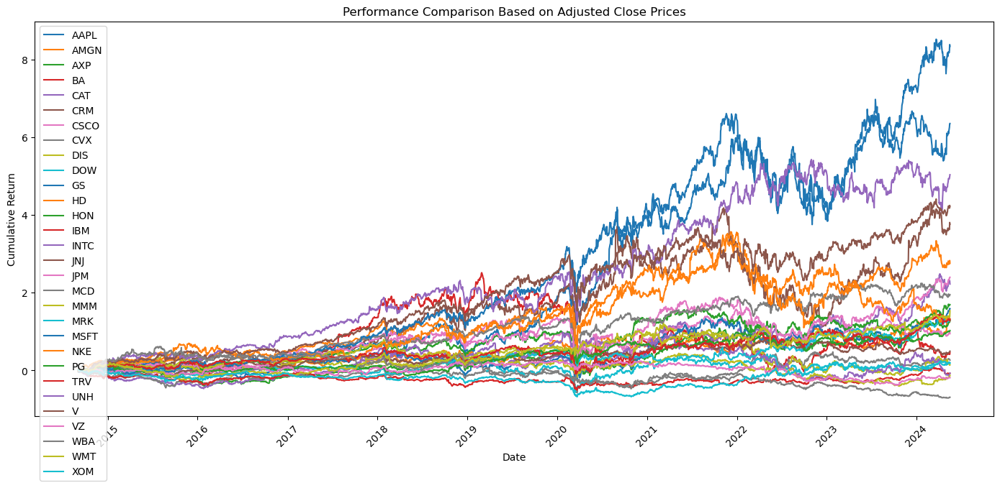

In [25]:
plt.figure(figsize=(14, 7))

# Plot the cumulative product of percentage changes to compare performance over time
for stock in df['Symbol'].unique():
    subset = df[df['Symbol'] == stock]
    # Calculate cumulative return
    cumulative_return = (1 + subset['Daily Return']).cumprod() - 1
    plt.plot(subset['Date'], cumulative_return, label=stock)

plt.title('Performance Comparison Based on Adjusted Close Prices')
plt.xlabel('Date')
plt.ylabel('Cumulative Return')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#### Volume vs. Price Movements

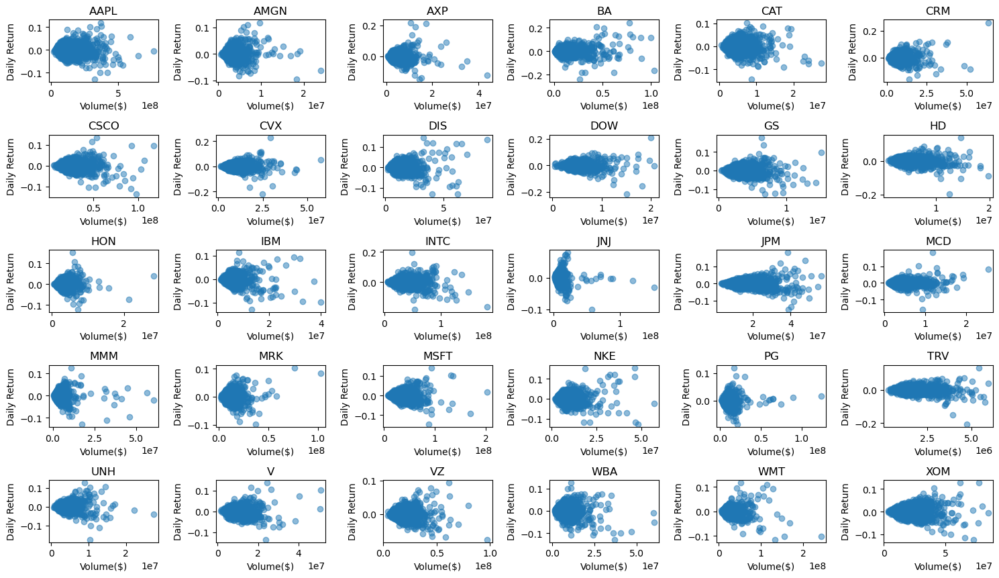

In [26]:
import matplotlib.pyplot as plt
import pandas as pd

unique_symbols = df['Symbol'].unique()
num_symbols = len(unique_symbols)

grid_size = int(num_symbols ** 0.5) + 1

plt.figure(figsize=(15, 10))

for i, symbol in enumerate(unique_symbols, start=1):
    plt.subplot(grid_size, grid_size, i)
    subset = df[df['Symbol'] == symbol]
    plt.scatter(subset['Volume($)'], subset['Daily Return'], alpha=0.5)
    plt.title(f'{symbol}')
    plt.xlabel('Volume($)')
    plt.ylabel('Daily Return')

plt.tight_layout()
plt.show()


In [27]:
correlation_df = df.groupby('Symbol').apply(lambda x: x[['Volume($)', 'Daily Return']].corr().iloc[0, 1])

print(correlation_df)


Symbol
AAPL   -0.064856
AMGN   -0.009049
AXP    -0.073201
BA      0.055423
CAT    -0.078372
CRM     0.049269
CSCO   -0.088275
CVX    -0.001114
DIS     0.016391
DOW    -0.020192
GS     -0.055014
HD     -0.109170
HON    -0.031738
IBM    -0.124039
INTC   -0.115327
JNJ    -0.107566
JPM    -0.058200
MCD     0.005271
MMM    -0.092370
MRK     0.060092
MSFT   -0.050676
NKE     0.013976
PG     -0.003692
TRV    -0.074952
UNH    -0.007593
V      -0.040838
VZ     -0.079136
WBA    -0.114463
WMT    -0.100962
XOM     0.000462
dtype: float64


C:\Users\Artem Frenk\AppData\Local\Temp\ipykernel_19384\3902831186.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  correlation_df = df.groupby('Symbol').apply(lambda x: x[['Volume($)', 'Daily Return']].corr().iloc[0, 1])


In [28]:
df['Symbol'].unique()



array(['AAPL', 'AMGN', 'AXP', 'BA', 'CAT', 'CRM', 'CSCO', 'CVX', 'DIS',
       'DOW', 'GS', 'HD', 'HON', 'IBM', 'INTC', 'JNJ', 'JPM', 'MCD',
       'MMM', 'MRK', 'MSFT', 'NKE', 'PG', 'TRV', 'UNH', 'V', 'VZ', 'WBA',
       'WMT', 'XOM'], dtype=object)